Imports

In [1]:
#imports
import cma
import numpy as np
import pandas as pd
# import jax.numpy as jnp
import os
from datetime import datetime
from double_pendulum.model.plant import DoublePendulumPlant
from double_pendulum.simulation.simulation import Simulator
from double_pendulum.utils.plotting import plot_timeseries
from double_pendulum.system_identification.sys_id import (run_system_identification,
                                                          run_system_identification_nl)
from double_pendulum.utils.csv_trajectory import save_trajectory, concatenate_trajectories
from double_pendulum.controller.gravity_compensation.gravity_compensation_controller import GravityCompensationController
from double_pendulum.controller.pid.trajectory_pid_controller import TrajPIDController
%matplotlib inline
from IPython.display import HTML
import matplotlib as mpl
mpl.rcParams['animation.writer'] = "pillow"
import matplotlib.pyplot as plt

In [2]:
# Set up provisional plant
no = '05'
torque_limit= [0.14, 0.14]
# Plant Model Setup
plant = DoublePendulumPlant(
    mass=[0.131, 0.064],
    length=[0.05, 0.05] ,
    com=[0.046, 0.048],
    gravity=9.81,
    inertia=[0.000277196, 0.000147456],
    damping=[0.002137, 0.0003603],
    torque_limit=torque_limit,
)
sim = Simulator(plant=plant)

# Trajectory Setup
# csv_path = "data/trajectory-pos-50.csv"
# csv_path = f"traj_gen/trjs/traj{no}.csv"
csv_path = f"traj_gen/stress_trajs/S{no}.csv"


data = pd.read_csv(csv_path)

time_traj = np.asarray(data["time"])
pos1_traj = np.asarray(data["pos1"])
pos2_traj = np.asarray(data["pos2"])
vel1_traj = np.asarray(data["vel1"])
vel2_traj = np.asarray(data["vel2"])
acc1_traj = np.asarray(data["acc1"])
acc2_traj = np.asarray(data["acc2"])

T_des = time_traj
X_des = np.asarray([pos1_traj, pos2_traj, vel1_traj, vel2_traj]).T
ACC_des = np.asarray([acc1_traj, acc2_traj]).T

# Controller parameters
Kp = 0.14
Ki = 0.01
Kd = 0.002
dt=0.005
tf=20+dt
trajPID_controller = TrajPIDController(csv_path=csv_path, dt=dt, torque_limit=torque_limit)
trajPID_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)
sim.reset()
sim.set_desired_traj(T_des, X_des)
x0=[0.0,0,0,0]

In Simulation


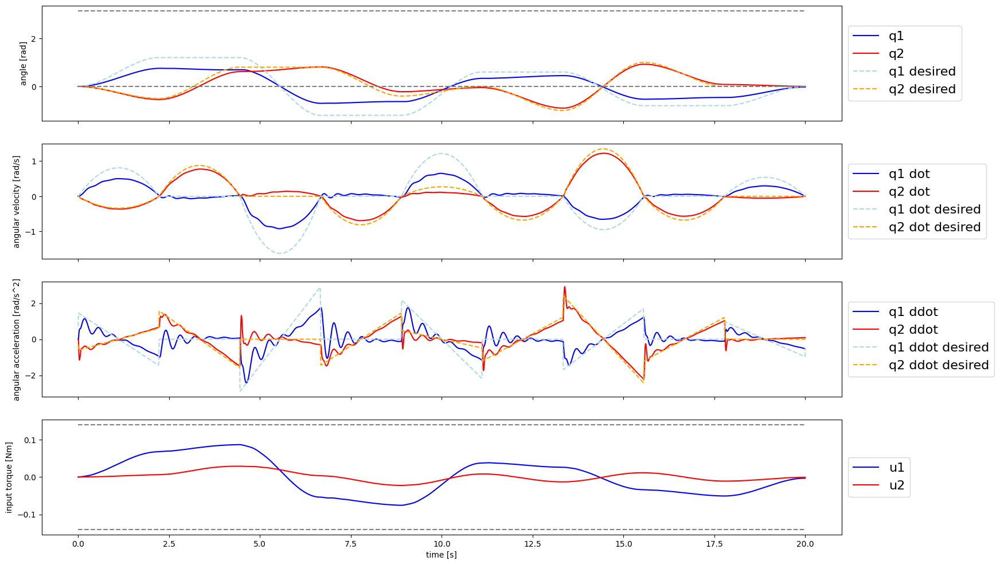

In [3]:
# Simulation
trajPID_controller.init()
trajPID_controller.counter=0
mpl.rcParams['animation.embed_limit'] = 200
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=tf,
    dt=dt,
    controller=trajPID_controller,
    integrator="runge_kutta",
    plot_inittraj=True,
    anim_dt=0.1,
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

acc = np.diff(np.asarray(X).T[2:, :]).T / dt
acc = np.insert(acc, 0, [0, 0], axis=0)

plot_timeseries(
    T,
    X,
    U,
    acc,
    plot_acc=True,
    plot_energy=False,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[0], torque_limit[0]],
    T_des=T_des,
    X_des=X_des,
    ACC_des=ACC_des,
)

ON HARDWARE

In [4]:
user_token = "1747283276843825152"

In [5]:
trajPID_controller.counter=0
# Hardware Implementation
trajPID_controller = TrajPIDController(csv_path=csv_path, dt=dt, torque_limit=torque_limit)
trajPID_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)
T_exp, X_exp, U_exp, U_des_exp, vod_path, cell_id = sim.run_experiment(
    tf=tf,
    dt=dt,
    controller=trajPID_controller,
    experiment_type="DoublePendulum",
    user_token=user_token,
    preparation_time=5.0,
    x0=x0,
    record=False
)



Successfully reserved cell on the server
Livestream url:  http://cloudpendulum.m2.chalmers.se:5080/live/viewer.jsp?host=cloudpendulum.m2.chalmers.se&stream=camera_171
Starting experiment in 4 seconds
Starting experiment in 3 seconds
Starting experiment in 2 seconds
Starting experiment in 1 seconds
Starting experiment
Your session token is: 2305557925764952832
Detected cell/camera: 171
n:4000
Control Loop Started!
Initial state x: [0.00052731 0.00191748 0.07107917 0.4539246 ]
Control Loop Ended!
Finished - avg exec frequency: 791.1263810437353  - min exec frequency: 45.839888960535085  - max exec frequency: 1290.555076923077
Returned valid samples: 3885
Final measured time: 20.000503063201904


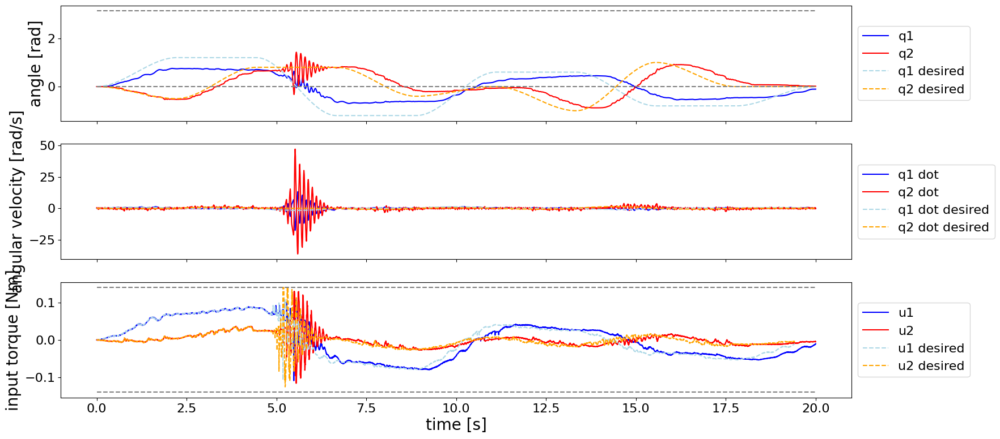

In [6]:
# Plotting
plot_timeseries(
    T=T_exp,
    X=X_exp,
    U=U_exp,
    T_des=T_des,
    X_des=X_des,
    U_des=U_des_exp,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[1], torque_limit[1]],
)

# Show the video
# from IPython.display import Video
# Video(vod_path)

Save as CSV Flie


In [7]:
# Get data files
measured_csv_data = np.array([T_exp, np.asarray(X_exp).T[0], np.asarray(X_exp).T[1], np.asarray(X_exp).T[2], np.asarray(X_exp).T[3], np.asarray(U_exp).T[0],np.asarray(U_exp).T[1]]).T
np.savetxt(f"data_test/{cell_id}_datastress_{no}.csv", measured_csv_data, delimiter = ',', header="time,pos_meas1,pos_meas2,vel_meas1,vel_meas2,tau_meas1,tau_meas2", comments="")